In [1]:
from datetime import datetime

#import data_analysis_octopus as dao
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import phik
import plotly.express as px
import plotly.graph_objects as go
import plotly.graph_objs as go
import plotly.io as pio
import seaborn as sns
from scipy import stats
from sklearn import set_config
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, MDS
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.impute import KNNImputer
from sklearn.ensemble import IsolationForest
from collections import Counter
from sklearn.preprocessing import OneHotEncoder
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import (calinski_harabasz_score, davies_bouldin_score,
                             jaccard_score, pairwise_distances,
                             silhouette_score)



def get_cluster_range(model_name, min_clusters, max_clusters, min_eps, max_eps, eps_step):
    if model_name in ["KMeans", "AgglomerativeClustering", "GaussianMixture"]:
        return list(range(min_clusters, max_clusters + 1)), "n_clusters" if model_name != "GaussianMixture" else "n_components"
    elif model_name == "DBSCAN":
        return [min_eps + i * eps_step for i in range(int((max_eps - min_eps) / eps_step) + 1)], "eps"
    else:
        raise ValueError("Modelo no soportado")


def calculate_scores(data, labels):
    if len(set(labels)) > 1:
        silhouette = silhouette_score(data, labels)
        calinski_harabasz = calinski_harabasz_score(data, labels)
        davies_bouldin = davies_bouldin_score(data, labels)
    else:
        silhouette = calinski_harabasz = davies_bouldin = None
    return silhouette, calinski_harabasz, davies_bouldin


def evaluate_clustering_score(data, model, model_args, min_clusters=2, max_clusters=10,
                              min_eps=0.1, max_eps=1.0, eps_step=0.1, fig_size=(800, 600)):
    model_name = model.__name__
    clusters_range, cluster_argument = get_cluster_range(model_name, min_clusters, max_clusters, min_eps, max_eps, eps_step)
    
    results = []
    for value in clusters_range:
        model_args[cluster_argument] = value
        model_instance = model(**model_args)
        labels = model_instance.fit_predict(data)
        
        silhouette, calinski_harabasz, davies_bouldin = calculate_scores(data, labels)
        
        cluster_sizes = [sum(labels == i) for i in set(labels) if i != -1] if silhouette or calinski_harabasz else []
        cluster_size_text = "<br>".join([f"Cluster {i}: {size}" for i, size in enumerate(cluster_sizes)]) if cluster_sizes else "No se pueden calcular las métricas"

        results.append({
            cluster_argument: value,
            "silhouette_score": silhouette,
            "calinski_harabasz_score": calinski_harabasz,
            "davies_bouldin_score": davies_bouldin,
            "cluster_size_text": cluster_size_text
        })

    results_df = pd.DataFrame(results)

    fig_silhouette = px.line(results_df, x=cluster_argument, y="silhouette_score",
                             hover_data=["cluster_size_text"],
                             labels={cluster_argument: cluster_argument, "silhouette_score": "Silhouette Score"},
                             title=f"Silhouette Score para {model_name}")
    
    fig_calinski = px.line(results_df, x=cluster_argument, y="calinski_harabasz_score",
                           hover_data=["cluster_size_text"],
                           labels={cluster_argument: cluster_argument, "calinski_harabasz_score": "Calinski-Harabasz Score"},
                           title=f"Calinski-Harabasz Score para {model_name}")
    
    fig_davies_bouldin = px.line(results_df, x=cluster_argument, y="davies_bouldin_score",
                                 hover_data=["cluster_size_text"],
                                 labels={cluster_argument: cluster_argument, "davies_bouldin_score": "Davies-Bouldin Score"},
                                 title=f"Davies-Bouldin Score para {model_name}")

    fig_silhouette.update_layout(width=fig_size[0], height=fig_size[1])
    fig_calinski.update_layout(width=fig_size[0], height=fig_size[1])
    fig_davies_bouldin.update_layout(width=fig_size[0], height=fig_size[1])

    fig_silhouette.update_traces(textposition="top center")
    fig_calinski.update_traces(textposition="top center")
    fig_davies_bouldin.update_traces(textposition="top center")

    fig_silhouette.show()
    fig_calinski.show()
    fig_davies_bouldin.show()

In [2]:
random_seed = 333  # Semilla para reproducibilidad de resultados
np.random.seed(random_seed)  # Para reproducibilidad
# Configuración de opciones de visualización para pandas
pd.set_option("display.max_columns", None)  # Muestra todas las columnas
pd.set_option("display.max_rows", 20)  # Ajusta el número de filas a mostrar

# Configuraciones extras
sns.set_style("dark")
dark_template = pio.templates["plotly_dark"].to_plotly_json()
dark_template["layout"]["paper_bgcolor"] = "rgba(30, 30, 30, 0.5)"
dark_template["layout"]["plot_bgcolor"] = "rgba(30, 30, 30, 0)"
pio.templates["plotly_dark_semi_transparent"] = go.layout.Template(dark_template)
pio.templates.default = "plotly_dark_semi_transparent"
set_config(transform_output="pandas")
set_config(display="diagram")

%matplotlib inline

# Lectura de Datos

In [3]:
# dict_df=pd.read_excel("/Users/vanessapaolaalfarosegura/Downloads/FIFA19-MD.xlsx")
dict_df = pd.read_csv("https://raw.githubusercontent.com/cuauhtemocbe/Diplomado-Ciencia-Datos/main/data/FIFA/FIFA19-DS.csv")
dict_df.head()

,ID,Age,Overall,Potential,Value,Wage,Special,International Reputation,Weak Foot,Skill Moves,Work Rate,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Preferred Foot,Body Type,Position
0,158023,31,94,94,110500000,565000,2202,5,4,4,4,5.70,159,90.0,90.0,90.0,94.0,95.0,95.0,95.0,94.0,95.0,95.0,95.0,93.0,86.0,86.0,86.0,93.0,66.0,63.0,63.0,63.0,66.0,61.0,49.0,49.0,49.0,61.0,84,95,70,90,86,97,93,94,87,96,91,86,91,95,95,85,68,72,59,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,Left,Lean,ST
1,20801,33,94,94,77000000,405000,2228,5,4,5,6,6.20,183,94.0,94.0,94.0,92.0,93.0,93.0,93.0,92.0,91.0,91.0,91.0,91.0,84.0,84.0,84.0,91.0,68.0,64.0,64.0,64.0,68.0,64.0,56.0,56.0,56.0,64.0,84,94,89,81,87,88,81,76,77,94,89,91,87,96,70,95,95,88,79,93,63,29,95,82,85,95,28,31,23,7,11,15,14,11,Right,Normal,ST
2,190871,26,92,93,118500000,290000,2143,5,5,5,7,5.90,150,87.0,87.0,87.0,92.0,92.0,92.0,92.0,92.0,92.0,92.0,92.0,91.0,84.0,84.0,84.0,91.0,68.0,63.0,63.0,63.0,68.0,63.0,50.0,50.0,50.0,63.0,79,87,62,84,84,96,88,87,78,95,94,90,96,94,84,80,61,81,49,82,56,36,89,87,81,94,27,24,33,9,9,15,15,11,Right,Lean,AM
3,192985,27,91,92,102000000,355000,2281,4,5,4,8,5.11,154,85.0,85.0,85.0,90.0,90.0,90.0,90.0,90.0,91.0,91.0,91.0,91.0,90.0,90.0,90.0,91.0,80.0,80.0,80.0,80.0,80.0,76.0,69.0,69.0,69.0,76.0,93,82,55,92,82,86,85,83,91,91,78,76,79,91,77,91,63,90,75,91,76,61,87,94,79,88,68,58,51,15,13,5,10,13,Right,Normal,MF
4,183277,27,91,91,93000000,340000,2142,4,4,4,7,5.80,163,86.0,86.0,86.0,92.0,91.0,91.0,91.0,92.0,92.0,92.0,92.0,92.0,85.0,85.0,85.0,92.0,69.0,66.0,66.0,66.0,69.0,63.0,52.0,52.0,52.0,63.0,81,84,61,89,80,95,83,79,83,94,94,88,95,90,94,82,56,83,66,80,54,41,87,89,86,91,34,27,22,11,12,6,8,8,Right,Normal,ST


In [4]:
# df = pd.read_csv("/Users/vanessapaolaalfarosegura/Downloads/FIFA19-DS.csv", index_col="ID")
raw_df = pd.read_csv("https://raw.githubusercontent.com/cuauhtemocbe/Diplomado-Ciencia-Datos/main/data/FIFA/FIFA19-DS.csv",
                 index_col="ID")
raw_df.head()

,Age,Overall,Potential,Value,Wage,Special,International Reputation,Weak Foot,Skill Moves,Work Rate,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Preferred Foot,Body Type,Position
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
158023,31,94,94,110500000,565000,2202,5,4,4,4,5.70,159,90.0,90.0,90.0,94.0,95.0,95.0,95.0,94.0,95.0,95.0,95.0,93.0,86.0,86.0,86.0,93.0,66.0,63.0,63.0,63.0,66.0,61.0,49.0,49.0,49.0,61.0,84,95,70,90,86,97,93,94,87,96,91,86,91,95,95,85,68,72,59,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,Left,Lean,ST
20801,33,94,94,77000000,405000,2228,5,4,5,6,6.20,183,94.0,94.0,94.0,92.0,93.0,93.0,93.0,92.0,91.0,91.0,91.0,91.0,84.0,84.0,84.0,91.0,68.0,64.0,64.0,64.0,68.0,64.0,56.0,56.0,56.0,64.0,84,94,89,81,87,88,81,76,77,94,89,91,87,96,70,95,95,88,79,93,63,29,95,82,85,95,28,31,23,7,11,15,14,11,Right,Normal,ST
190871,26,92,93,118500000,290000,2143,5,5,5,7,5.90,150,87.0,87.0,87.0,92.0,92.0,92.0,92.0,92.0,92.0,92.0,92.0,91.0,84.0,84.0,84.0,91.0,68.0,63.0,63.0,63.0,68.0,63.0,50.0,50.0,50.0,63.0,79,87,62,84,84,96,88,87,78,95,94,90,96,94,84,80,61,81,49,82,56,36,89,87,81,94,27,24,33,9,9,15,15,11,Right,Lean,AM
192985,27,91,92,102000000,355000,2281,4,5,4,8,5.11,154,85.0,85.0,85.0,90.0,90.0,90.0,90.0,90.0,91.0,91.0,91.0,91.0,90.0,90.0,90.0,91.0,80.0,80.0,80.0,80.0,80.0,76.0,69.0,69.0,69.0,76.0,93,82,55,92,82,86,85,83,91,91,78,76,79,91,77,91,63,90,75,91,76,61,87,94,79,88,68,58,51,15,13,5,10,13,Right,Normal,MF
183277,27,91,91,93000000,340000,2142,4,4,4,7,5.80,163,86.0,86.0,86.0,92.0,91.0,91.0,91.0,92.0,92.0,92.0,92.0,92.0,85.0,85.0,85.0,92.0,69.0,66.0,66.0,66.0,69.0,63.0,52.0,52.0,52.0,63.0,81,84,61,89,80,95,83,79,83,94,94,88,95,90,94,82,56,83,66,80,54,41,87,89,86,91,34,27,22,11,12,6,8,8,Right,Normal,ST


# EDA

In [5]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17140 entries, 158023 to 242844
Data columns (total 75 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       17140 non-null  int64  
 1   Overall                   17140 non-null  int64  
 2   Potential                 17140 non-null  int64  
 3   Value                     17140 non-null  int64  
 4   Wage                      17140 non-null  int64  
 5   Special                   17140 non-null  int64  
 6   International Reputation  17140 non-null  int64  
 7   Weak Foot                 17140 non-null  int64  
 8   Skill Moves               17140 non-null  int64  
 9   Work Rate                 17140 non-null  int64  
 10  Height                    17140 non-null  float64
 11  Weight                    17140 non-null  int64  
 12  LS                        15298 non-null  float64
 13  ST                        15298 non-null  float64
 14  RS   

## Selección de Varibles

## Tipos de variables

In [6]:
df = raw_df.drop(columns= ["Height", "Weight"], axis=1)

In [7]:
# categorical_features = [c for c in df.columns if c not in numerical_features]
categorical_features = [
    "Weak Foot",
    "International Reputation", "Skill Moves", 
    "Preferred Foot", "Body Type", "Position"]

In [8]:
numerical_features = [c for c in df.columns if c not in categorical_features]

## Identificación y tratamiento de valores nulos

In [9]:
# Identificar y contar valores nulos por variable
nulos_por_var = df.isnull().mean()

In [10]:
nulos= nulos_por_var[nulos_por_var > 0]
nulos

LS     0.107468
ST     0.107468
RS     0.107468
LW     0.107468
LF     0.107468
         ...   
LB     0.107468
LCB    0.107468
CB     0.107468
RCB    0.107468
RB     0.107468
Length: 26, dtype: float64

## Imputación de datos

In [11]:
for col in numerical_features:
    media = df[col].median()
    df.loc[:, col] = df[col].fillna(media)

for col in categorical_features:
    moda = df[col].mode()[0]
    df.loc[:, col] = df[col].fillna(moda)

## Detección y tratamiento de Outliers

In [12]:
df[numerical_features] = df[numerical_features].astype(float)

iso_forest = IsolationForest(contamination=0.05, random_state=random_seed)
df["is_outlier"] = iso_forest.fit_predict(df[numerical_features])

df.value_counts("is_outlier")

is_outlier
 1    16283
-1      857
Name: count, dtype: int64

In [13]:
df.loc[df["is_outlier"] == -1, numerical_features] = np.nan

imputer = KNNImputer(n_neighbors=5)
df[numerical_features] = imputer.fit_transform(df[numerical_features])

df = df.drop(columns="is_outlier")

## Tratamiento variables categóricas

In [14]:
encoder = OneHotEncoder(drop="first", sparse_output=False, dtype=int)
encoded_df = encoder.fit_transform(df[categorical_features].astype(str))

## Correlaciones

In [15]:
# Correlaciones
phik_df = df.phik_matrix()
styled_corr = phik_df.corr().style.applymap(lambda x: "color: red" if ((abs(x) > 0.4) & (abs(x) < 1)) 
                                 else ("color: transparent" if x == 1 else "color: white"))
styled_corr

interval columns not set, guessing: ['Age', 'Overall', 'Potential', 'Value', 'Wage', 'Special', 'International Reputation', 'Weak Foot', 'Skill Moves', 'Work Rate', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes']


/tmp/ipykernel_732/2290510831.py:3: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_corr = phik_df.corr().style.applymap(lambda x: "color: red" if ((abs(x) > 0.4) & (abs(x) < 1))


,Age,Overall,Potential,Value,Wage,Special,International Reputation,Weak Foot,Skill Moves,Work Rate,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Preferred Foot,Body Type,Position
Age,1.000000,0.409861,0.311173,0.161762,0.176898,0.157097,0.365918,-0.225151,-0.067469,0.361981,0.048441,0.048441,0.048441,0.009417,0.024153,0.024153,0.024153,0.009417,0.025771,0.025771,0.025771,0.041999,0.186364,0.186364,0.186364,0.041999,0.300232,0.341853,0.341853,0.341853,0.300232,0.297363,0.326617,0.326617,0.326617,0.297363,0.009046,-0.017364,0.105382,0.088479,0.000405,-0.087155,-0.019291,0.001446,0.141036,-0.012101,0.010968,0.030849,-0.091668,0.479058,-0.116452,0.039589,0.266785,0.192224,0.349716,0.014117,0.254470,0.297675,-0.004334,0.020850,0.016942,0.339658,0.226068,0.236131,0.204622,-0.018407,-0.102132,-0.021414,0.003381,-0.090564,-0.372187,0.061534,-0.132701
Overall,0.409861,1.000000,0.842792,0.922375,0.892558,0.477599,0.630559,0.008805,0.253359,0.336634,0.557121,0.557121,0.557121,0.585582,0.612195,0.612195,0.612195,0.585582,0.620137,0.620137,0.620137,0.625337,0.750966,0.750966,0.750966,0.625337,0.666578,0.638886,0.638886,0.638886,0.666578,0.617893,0.533278,0.533278,0.533278,0.617893,0.281569,0.260226,0.028821,0.471802,0.235097,0.348397,0.238433,0.162007,0.418819,0.461964,-0.155251,-0.142785,-0.083350,0.933558,-0.256618,0.309934,-0.100464,0.084668,0.039953,0.293638,0.135743,0.398753,0.303690,0.487860,0.147746,0.694440,0.291139,0.357597,0.340708,-0.076710,-0.189766,-0.093908,-0.076811,-0.182222,-0.394350,-0.400791,-0.071341
Potential,0.311173,0.842792,1.000000,0.844818,0.762683,0.280868,0.470833,-0.029884,0.119902,0.169649,0.419609,0.419609,0.419609,0.474649,0.484607,0.484607,0.484607,0.474649,0.495811,0.495811,0.495811,0.505420,0.554490,0.554490,0.554490,0.505420,0.418134,0.389315,0.389315,0.389315,0.418134,0.375740,0.296488,0.296488,0.296488,0.375740,0.107110,0.096930,-0.149183,0.311587,0.069648,0.249430,0.085364,0.000054,0.237368,0.345152,-0.189817,-0.178471,-0.146410,0.716423,-0.302573,0.147316,-0.189624,-0.098998,-0.136963,0.141930,-0.097747,0.180442,0.146382,0.365215,-0.013125,0.489172,0.089953,0.161481,0.142889,-0.139772,-0.241716,-0.192586,-0.165334,-0.221408,-0.369245,-0.355934,-0.253429
Value,0.161762,0.922375,0.844818,1.000000,0.931454,0.416393,0.602483,0.105443,0.251809,0.247552,0.643772,0.643772,0.643772,0.689108,0.707514,0.707514,0.707514,0.689108,0.715023,0.715023,0.715023,0.717182,0.756340,0.756340,0.756340,0.717182,0.534717,0.485977,0.485977,0.485977,0.534717,0.478761,0.371629,0.371629,0.371629,0.478761,0.258092,0.267793,-0.078665,0.433211,0.240616,0.396313,0.246406,0.146108,0.346047,0.494073,-0.181483,-0.174505,-0.069987,0.853299,-0.254515,0.313780,-0.224524,-0.048722,-0.086604,0.306333,-0.050749,0.232744,0.320518,0.558165,0.130048,0.625173,0.126396,0.207012,0.200615,-0.184644,-0.296912,-0.193270,-0.194423,-0.289608,-0.327080,-0.419596,-0.135770
Wage,0.176898,0.892558,0.762683,0.931454,1.000000,0.339647,0.663893,0.010495,0.150054,0.220505,0.504793,0.504793,0.504793,0.544169,0.568070,0.568070,0.568070,0.544169,0.577201,0.577201,0.577201,0.580501,0.672373,0.672373,0.672373,0.580501,0.580023,0.552706,0.552706,0.552706,0.580023,0.538632,0.459401,0.459401,0.459401,0.538632,0.178135,0.163184,-0.079314,0.367449,0.144318,0.263288,0.141612,0.052096,0.309779,0.373874,-0.271281,-0.260496,-0.180097,0.831133,-0.332267,0.218901,-0.171016,-0.079941,-0.041706,0.192841,0.012990,0.307222,0.200886,0.429759,0.052819,0.575323,0.192402,0.271571,0.270796,-0.226919,-0.326699,-0.235452,-0.234939,-0.327256,-0.343563,-0.425653,-0.171837
Special,0.157097,0.4

# Reducción de Dimensiones

De acuerdo a la matriz de correlaciones obtenida, se destacan variables con altas correlaciones, por lo que optamos por reducir dimensiones.

In [16]:
scaler=StandardScaler()
scaled_data = scaler.fit_transform(df[numerical_features])
#  Aplicar PCA
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(scaled_data)
X_pca.head(1)

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13
ID,,,,,,,,,,,,,,
158023,-5.865163e-17,3.774758e-16,1.165455e-16,-1.209214e-16,-4.434187e-16,-1.692390e-16,9.808822e-18,1.242938e-16,-4.470807e-16,1.254805e-16,-8.046656e-17,3.936612e-17,-3.428739e-16,-1.187101e-16


In [17]:
ve = pd.DataFrame(
    data    = (pca.explained_variance_ratio_ * 100).round(2),
    columns = ["variance_ratio"],
    index=[f"PC{i+1}" for i in range(pca.n_components_)],
)

ve

,variance_ratio
PC1,39.97
PC2,21.05
PC3,18.29
PC4,4.17
PC5,2.79
PC6,2.15
PC7,1.47
PC8,1.11
PC9,0.96
PC10,0.84


In [18]:
# pca.components_[1,:5] *= -1
tr = pd.DataFrame(
    data    = pca.components_[0:2,:],
    columns = df[numerical_features].columns,
    index   = ["PC1", "PC2"]
).T

tr.sort_values(by="PC1",ascending=False)

,PC1,PC2
Special,0.179459,0.053231
BallControl,0.163030,0.006661
LongShots,0.161894,-0.057167
Curve,0.161444,-0.029961
Dribbling,0.161161,-0.033832
...,...,...
GKKicking,-0.096120,-0.043276
GKPositioning,-0.096131,-0.042334
GKHandling,-0.096598,-0.043224
GKReflexes,-0.096696,-0.043116


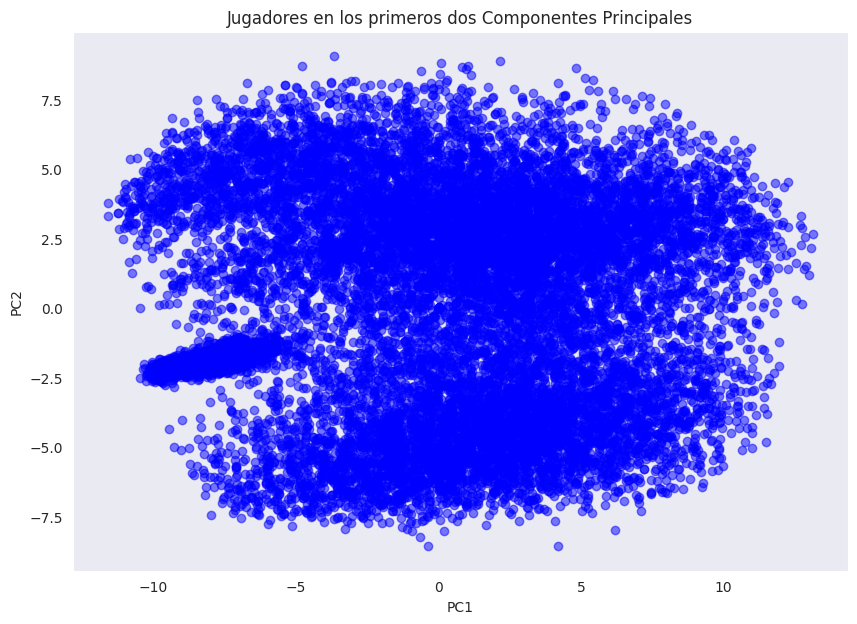

In [19]:
plt.figure(figsize=(10,7))
plt.scatter(X_pca["pca0"], X_pca["pca1"], c="blue", alpha=0.5)
plt.title("Jugadores en los primeros dos Componentes Principales")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

# Métodos de Segmentación

In [20]:
processed_df = pd.concat([encoded_df, X_pca], axis=1)
processed_df.head(1)

,Weak Foot_2,Weak Foot_3,Weak Foot_4,Weak Foot_5,International Reputation_2,International Reputation_3,International Reputation_4,International Reputation_5,Skill Moves_2,Skill Moves_3,Skill Moves_4,Skill Moves_5,Preferred Foot_Right,Body Type_Normal,Body Type_Stocky,Position_DF,Position_DM,Position_GK,Position_MF,Position_ST,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
158023,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,-5.865163e-17,3.774758e-16,1.165455e-16,-1.209214e-16,-4.434187e-16,-1.692390e-16,9.808822e-18,1.242938e-16,-4.470807e-16,1.254805e-16,-8.046656e-17,3.936612e-17,-3.428739e-16,-1.187101e-16


## KMeans

In [21]:
kmeans_args = {
    "random_state": random_seed,
    "n_init": "auto"
}

evaluate_clustering_score(
        processed_df,
        model=KMeans,
        model_args=kmeans_args,
        min_clusters=2,
        max_clusters=10,
        fig_size=(800, 600)
)

## Agglomerative Clustering

In [22]:
agglomerative_args = {
    "linkage": "ward"
}

evaluate_clustering_score(
        processed_df,
        model=AgglomerativeClustering,
        model_args=agglomerative_args,
        min_clusters=2,
        max_clusters=10,
        fig_size=(800, 600)
)
       

KeyboardInterrupt: 

## DBSCAN

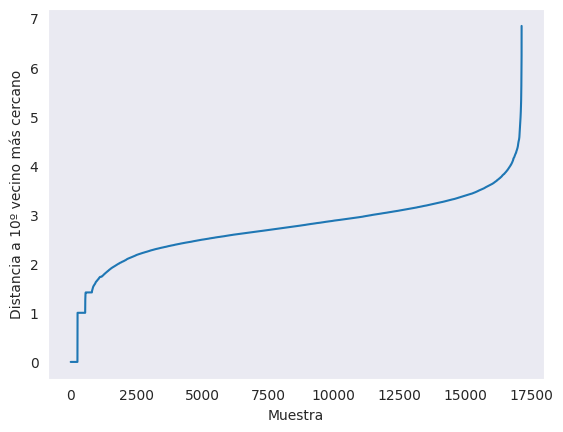

In [ ]:
# # Estima el mejor valor de eps usando la distancia de los vecinos más cercanos
nearest_neighbors = NearestNeighbors(n_neighbors=11)
neighbors = nearest_neighbors.fit(processed_df)
distances, indices = neighbors.kneighbors(processed_df)

# Ordena las distancias para observar el punto de codo
distances = np.sort(distances[:, 10])
plt.plot(distances)
plt.xlabel("Muestra")
plt.ylabel("Distancia a 10º vecino más cercano")
plt.show()

In [ ]:
dbscan_args = {
    "min_samples": 10
}

evaluate_clustering_score(
    X_pca,
    model=DBSCAN,
    model_args={},
    min_eps=3.5, max_eps=4, eps_step=0.1,
    fig_size=(800, 600)
)

In [ ]:
# # Evaluar GMM
# gmm_silhouette = silhouette_score(X_pca, gmm_labels)
# gmm_db_score = davies_bouldin_score(X_pca, gmm_labels)
# print(f"Silhouette Score GMM: {gmm_silhouette}")
# print(f"Davies-Bouldin Score GMM: {gmm_db_score}")

# # Evaluar DBSCAN
# dbscan_silhouette = silhouette_score(X_pca, dbscan_labels)
# dbscan_db_score = davies_bouldin_score(X_pca, dbscan_labels)
# print(f"Silhouette Score DBSCAN: {dbscan_silhouette}")
# print(f"Davies-Bouldin Score DBSCAN: {dbscan_db_score}")

In [ ]:
# # Agregar las etiquetas de cluster a tu dataset original (o reducido)
# X_pca_with_clusters = pd.DataFrame(X_pca, columns=[f"PC{i}" for i in range(1, X_pca.shape[1] + 1)])
# X_pca_with_clusters["Cluster_GMM"] = gmm_labels
# X_pca_with_clusters["Cluster_DBSCAN"] = dbscan_labels

# # Inspeccionar las características promedio por cluster
# cluster_stats_gmm = X_pca_with_clusters.groupby("Cluster_GMM").mean()
# cluster_stats_dbscan = X_pca_with_clusters.groupby("Cluster_DBSCAN").mean()

# print("Estadísticas por Cluster - GMM")
# print(cluster_stats_gmm)

# print("\nEstadísticas por Cluster - DBSCAN")
# print(cluster_stats_dbscan)

## GMM

In [ ]:
gmm_args = {
    "covariance_type": "full",
    "random_state":random_seed
}

evaluate_clustering_score(
        processed_df,
        model=GaussianMixture,
        model_args=gmm_args,
        min_clusters=2,
        max_clusters=10,
        fig_size=(800, 600)
)

Mejor número de clusters según BIC: 14


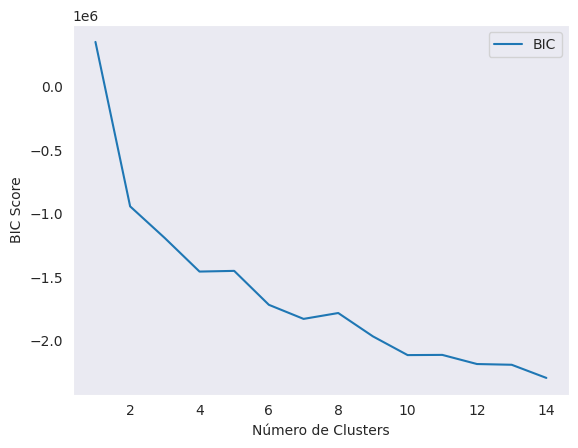

In [ ]:
n_components_range = range(1, 15)

gmm_models = [
    GaussianMixture(n_components=n, covariance_type='full', random_state=random_seed).fit(processed_df)
    for n in n_components_range
]

bic_scores = [model.bic(processed_df) for model in gmm_models]

# Selecciona el mejor número de clusters basado en el menor BIC
best_n_clusters_gmm = n_components_range[np.argmin(bic_scores)]
print(f"Mejor número de clusters según BIC: {best_n_clusters_gmm}")

# Visualiza BIC para diferentes números de clusters
plt.plot(n_components_range, bic_scores, label='BIC')
plt.xlabel('Número de Clusters')
plt.ylabel('BIC Score')
plt.legend()
plt.show()

In [ ]:
processed_df["cluster"] = GaussianMixture(
    n_components=4,
    covariance_type="full",
    random_state=random_seed
    ).fit_predict(processed_df)

processed_df["cluster"].value_counts().to_frame()

,count
cluster,
1,7509
2,7192
3,1746
0,693


In [ ]:
categorias = processed_df["cluster"].unique()
colores = px.colors.qualitative.Plotly  # Puedes elegir otros paletas

# Asegúrate de que haya suficientes colores en la lista
if len(categorias) > len(colores):
    colores = colores * (len(categorias) // len(colores) + 1)

# Selecciona solo los colores necesarios
colores = colores[:len(categorias)]

fig = px.scatter_3d(
    processed_df, 
    x="pca0", 
    y="pca1", 
    z="pca2",
    color="cluster",
    color_discrete_sequence=px.colors.qualitative.Plotly,
    opacity=0.8,
)

# Título y etiquetas
fig.update_layout(
    title="Visualización PCA en 3D con Clusters",
    scene=dict(
        xaxis_title="PCA 1",
        yaxis_title="PCA 2",
        zaxis_title="PCA 3"
    )
)

fig.update_traces(marker=dict(size=1)) 

# Mostrar el gráfico
fig.show()

In [23]:
tsne = TSNE(n_components=3, random_state=42)
X_tsne = tsne.fit_transform(processed_df)

In [24]:
X_tsne.to_pickle("X_tsne.pkl")

In [ ]:
backup = X_tsne.copy()

In [ ]:
X_tsne["cluster"] = processed_df["cluster"]
X_tsne.head(1)

,tsne0,tsne1,tsne2,cluster
ID,,,,
158023,5.849883,-3.989026,-23.197184,0


In [ ]:
categorias = processed_df["cluster"].unique()
colores = px.colors.qualitative.Plotly  # Puedes elegir otros paletas

# Asegúrate de que haya suficientes colores en la lista
if len(categorias) > len(colores):
    colores = colores * (len(categorias) // len(colores) + 1)

# Selecciona solo los colores necesarios
colores = colores[:len(categorias)]

fig = px.scatter_3d(
    X_tsne, 
    x="tsne0", 
    y="tsne1", 
    z="tsne2",
    color="cluster",  # Asigna color basado en la columna "cluster"
    color_continuous_scale=colores,  # Utiliza una paleta de colores cualitativos
    opacity=0.5,
)

# Título y etiquetas
fig.update_layout(
    title="Visualización t-SNE en 3D",
    scene=dict(
        xaxis_title="t-SNE 1",
        yaxis_title="t-SNE 2",
        zaxis_title="t-SNE 3"
    )
)
fig.update_traces(marker=dict(size=1)) 
# Mostrar el gráfico
fig.show()
